# <div id='data' style="color:white; font-weight:bold; font-size:120%; text-align:center;padding:12.0px; background:black"> LOADING AND PREPARING DATA</div>

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv, pd.read_parquet )
import polars as pl

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter

import os, gc
from tqdm.auto import tqdm
import pickle # module to serialize and deserialize objects
import re # for Regular expression operations 

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data  import Dataset, DataLoader
from pytorch_lightning import (LightningDataModule, LightningModule, Trainer)
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, Timer

from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingRegressor

import lightgbm as lgb
from lightgbm import LGBMRegressor

from xgboost import XGBRegressor
from catboost import CatBoostRegressor

import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

import kaggle_evaluation.jane_street_inference_server

Today, we embark on an exciting journey into the world of algorithmic trading using data from Jane Street. Our adventure begins by inviting numerous helpers that will assist us in analyzing and predicting financial trends. First, we gather tools for our calculations with the imports at the start, such as NumPy, which is like our trusty calculator for handling numbers, and Pandas, which organizes our information neatly, similar to a spreadsheet. Polars gives us even faster processing—a true speedster in our toolbox!

We’ll visualize our findings with Matplotlib and Seaborn, which are our artistic brushes for crafting beautiful graphs and informative plots to see patterns in our data visually. We fill our workspace with various packages to manage data responsibly (like avoiding clutter with garbage collection), and we even wear our caution hats with warnings to help avoid potential pitfalls.

Next, we prepare our minds for machine learning with TensorFlow and PyTorch—two powerful libraries that help us build models, similar to assembling robots that can learn from our data and improve over time through experience. We set the stage for practice by splitting our data into training sets and tests, an important tactic that ensures our models can generalize and perform well on new data.

The models we’ll build—like LightGBM, XGBoost, and CatBoost—are like powerful engines designed to churn through financial data and help us make predictions based on patterns they've learned. Each one has its own strengths, just like different vehicles suit different terrains.

Finally, we introduce a special mechanism for evaluation, akin to scoring our students' performances—this ensures our algorithms not only perform well in training but also in real-world predictions. With all these tools at our disposal, we are ready to dive deeper into our project and harness the power of data science to make informed trading decisions on the Jane Street dataset.

In [3]:
gridColor = 'lightgrey'

Imagine we are setting up a beautiful canvas for our algorithmic trading project, where we can visualize data and decisions clearly. The first step in creating this canvas involved choosing a color for the background, and in our case, we've selected a gentle shade called 'lightgrey'. Think of gridColor as the paint we pour into a bucket—it's the foundation that will enhance our visuals and help us better understand the underlying patterns in the data.

This single line does more than just pick a color; it assigns an identity to our canvas. By naming it ‘gridColor’, we now have a reference to call upon later when we want to create our visual layout. It’s like having a recipe card that specifies a critical ingredient, ensuring that we can recreate or adjust our designs without having to remember every detail each time. 

This choice of 'lightgrey' reflects our intention to keep things subtle and clean—much like a classic background that allows the important parts of our trading data to shine without distraction. In the context of our larger project, where we’ll visualize trading strategies and market movements, a suitable background will help viewers focus on trends and decisions that matter most, fostering better understanding and ultimately leading to more informed trading actions.

So, as we lay down this foundational color, imagine how each subsequent line we write will add to this framework, building a comprehensive and visually engaging trading tool that can guide our strategies at Jane Street. Each element we craft in this project will work together like a well-orchestrated symphony, each part contributing to the whole.

In [4]:
%%time
path = "/kaggle/input/jane-street-real-time-market-data-forecasting"
samples = [] 

# Load a data from each file:
r = range(2)
for i in r:
    file_path = f"{path}/train.parquet/partition_id={i}/part-0.parquet"
    part = pd.read_parquet(file_path)
    samples.append(part)
    
sample_df = pd.concat(samples, ignore_index=True) # Concatenate all samples into one DataFrame if needed

sample_df.round(1)

CPU times: user 7.32 s, sys: 4.21 s, total: 11.5 s
Wall time: 10.6 s


,date_id,time_id,symbol_id,weight,feature_00,feature_01,feature_02,feature_03,feature_04,feature_05,feature_06,feature_07,feature_08,feature_09,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,responder_0,responder_1,responder_2,responder_3,responder_4,responder_5,responder_6,responder_7,responder_8
0,0,0,1,3.9,NaN,NaN,NaN,NaN,NaN,0.9,0.2,0.3,-0.9,11,7,76,-0.9,0.0,-0.7,NaN,-0.2,NaN,-1.3,-1.7,0.9,NaN,1.6,1.5,-1.6,-0.2,NaN,NaN,1.4,-0.3,0.1,NaN,NaN,NaN,0.3,0.3,0.3,-0.0,-0.2,NaN,-1.1,NaN,NaN,-0.2,NaN,NaN,NaN,0.6,2.1,0.8,NaN,0.2,NaN,NaN,-0.8,NaN,-2.0,0.7,NaN,-1.0,-0.3,-1.4,NaN,NaN,NaN,NaN,NaN,-1.3,-0.1,-0.5,-1.0,0.2,-0.7,NaN,NaN,-0.3,-0.2,-0.3,-0.3,0.7,-0.1,1.4,2.0,0.2,1.2,0.8,0.3,0.1
1,0,0,7,1.4,NaN,NaN,NaN,NaN,NaN,0.7,0.2,0.2,-0.5,11,7,76,-0.9,-0.2,-0.6,NaN,0.3,NaN,-1.3,-1.7,1.4,NaN,0.5,0.7,-0.8,0.6,NaN,NaN,0.2,0.6,1.1,NaN,NaN,NaN,-1.5,-1.4,-1.8,-0.1,-0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.8,-0.0,-0.6,NaN,1.2,NaN,NaN,-1.6,NaN,-1.4,1.1,NaN,0.9,0.5,-1.4,NaN,NaN,NaN,NaN,NaN,-1.1,0.0,-0.6,-1.1,-0.4,-0.7,NaN,NaN,-0.3,-0.2,-0.2,-0.3,3.0,1.2,-0.5,3.8,2.6,5.0,0.7,0.2,0.8
2,0,0,9,2.3,NaN,NaN,NaN,NaN,NaN,1.1,0.2,0.2,-0.8,11,7,76,-0.7,-0.2,-0.6,NaN,-0.8,NaN,-1.3,-2.0,0.6,NaN,1.6,0.7,-1.4,0.4,NaN,NaN,-0.0,-0.3,-0.1,NaN,NaN,NaN,-0.3,-1.0,-2.4,0.1,-0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.4,-3.5,-4.7,NaN,0.5,NaN,NaN,-0.7,NaN,-2.3,1.8,NaN,-0.1,-0.1,-1.4,NaN,NaN,NaN,NaN,NaN,-0.9,-0.1,-0.6,-0.9,-0.2,-0.7,NaN,NaN,0.4,0.3,-0.1,-0.1,-0.9,-0.3,-0.3,0.4,1.3,0.1,2.1,0.7,0.8
3,0,0,10,0.7,NaN,NaN,NaN,NaN,NaN,1.1,0.3,0.3,-1.3,42,5,150,-0.7,3.0,0.1,NaN,-0.3,NaN,-1.9,-1.0,0.2,NaN,-0.4,-0.2,-2.1,-0.9,NaN,NaN,0.4,-0.6,0.1,NaN,NaN,NaN,0.5,-0.1,-1.5,-0.2,-0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4,2.7,0.6,NaN,2.4,NaN,NaN,1.3,NaN,-0.8,2.9,NaN,4.0,1.8,-1.4,NaN,NaN,NaN,NaN,NaN,-0.7,1.1,-0.2,-0.5,4.8,0.6,NaN,NaN,-0.2,-0.3,-0.2,-0.3,0.4,0.2,2.3,1.1,1.2,1.2,1.1,0.8,-1.4
4,0,0,14,0.4,NaN,NaN,NaN,NaN,NaN,1.0,0.3,0.3,-0.6,44,3,16,-0.9,-0.0,-0.5,NaN,0.6,NaN,-1.8,-1.6,-0.2,NaN,-1.0,-0.7,-1.3,-1.4,NaN,NaN,0.0,-0.3,-0.0,NaN,NaN,NaN,-0.1,-1.0,-2.6,-0.2,-0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,-2.3,-3.7,NaN,1.3,NaN,NaN,0.5,NaN,-0.8,2.8,NaN,1.4,0.4,-1.4,NaN,NaN,NaN,NaN,NaN,-0.9,-0.1,-0.4,-1.1,0.1,-0.7,NaN,NaN,3.7,2.8,2.6,3.4,-0.4,-0.5,-0.3,-3.9,-1.6,-5.0,-3.6,-1.1,-5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4748452,339,848,19,4.4,-0.4,-1.1,-0.4,0.0,-1.2,-0.1,0.5,0.3,-0.2,4,3,11,0.3,1.4,0.2,-0.6,-0.4,-0.7,0.0,4.9,0.6,NaN,0.9,0.3,-0.1,0.5,NaN,NaN,0.4,-0.7,-0.7,NaN,0.2,-0.6,0.4,0.4,-1.0,-1.0,-1.2,0.2,1.3,0.8,1.4,0.2,0.4,1.0,2.0,1.3,2.1,0.9,0.8,1.6,1.3,1.9,1.1,1.6,1.3,2.5,1.7,3.1,1.8,0.6,-0.4,-0.2,-0.5,-0.5,4.2,-0.0,-0.1,-0.3,0.4,4.4,0.7,-0.0,0.1,-0.2,-0.1,-0.2,-0.1,0.2,0.1,1.1,0.5,0.3,0.5,0.0,0.0,0.0
4748453,339,848,30,0.9,0.0,-1.1,-0.3,-0.2,-1.1,-0.1,0.5,0.3,-0.5,81,2,534,0.2,1.2,0.4,0.3,0.3,0.2,1.9,-1.8,-0.6,NaN,-1.3,-1.0,-0.6,-0.6,NaN,NaN,-0.3,0.0,0.2,NaN,0.5,-1.0,0.2,1.1,0.6,2.2,-0.5,2.4,-1.4,-1.4,0.3,-0.6,-0.2,0.3,-0.9,1.4,0.5,0.9,2.0,1.4,0.2,-0.5,-1.3,-0

Imagine embarking on a journey where each step takes us closer to understanding the financial data we need for our algo trading project. Here, we start by setting the stage with a path to our treasure trove of market data, located in a special folder indicated by the variable named `path`. Now, think of `samples` as a collection basket we carry, ready to gather all the important pieces of information we’ll uncover.

Next, we decide to explore just a couple of the partitions within our treasure chest, represented by a range of numbers from 0 to 1. Each number in this range stands for a different time segment of data, much like flipping through snapshots in a photo album. The for-loop is our trusty repeating tool, allowing us to go through each segment one by one, much like following steps in a recipe.

Inside this loop, we create a path to each specific file using string formatting, which crafts the precise address we need to access each piece of the data. Then, we open up this file using a method that reads the data and brings it into our workspace, like extracting beautiful gems from a hidden cave. Each piece of data gets added to our sample collection basket, `samples`.

After gathering all our segments, we combine them into a single large table called a DataFrame, which we can think of as a well-organized workbook filled with valuable insights. Finally, we round the numbers in this DataFrame to make them neater and more manageable, ensuring they’re easy to read just like polishing our gems for display. With our data prepared, we’re ready to dive deeper and analyze how we can make informed trading decisions in the exciting world of the market!

We have two files (0 and 1) that contain a total of 4,748,457 rows. I used pandas to load the data, and it took nearly 9 seconds. This dataset spans 339 days, which is roughly one year of trading data.

# <div id='eda' style="color:white; font-weight:bold; font-size:120%; text-align:center;padding:12.0px; background:black">Exploring Time Series Analysis and EDA</div>

Let’s examine the target values for `symbol_id` = 1 over time.

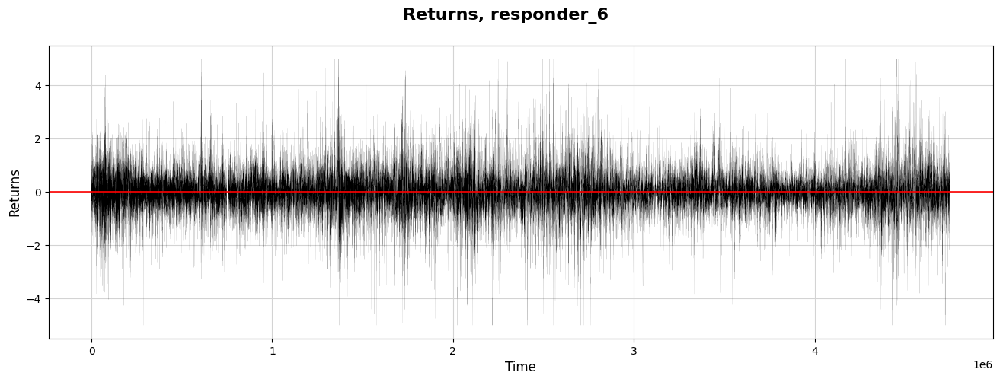

In [4]:
train =sample_df
train['N']=train.index.values 
train['id']=train.index.values 

xx= sample_df[(sample_df.symbol_id==1)] ['id']
yy=sample_df[ (sample_df.symbol_id==1)]['responder_6']

plt.figure(figsize=(16, 5))
plt.plot(xx,yy, color = 'black', linewidth =0.05)
plt.suptitle('Returns, responder_6', weight='bold', fontsize=16)
plt.xlabel("Time", fontsize=12)
plt.ylabel("Returns", fontsize=12)
plt.grid(color = gridColor , linewidth=0.8)
plt.axhline(0, color='red', linestyle='-', linewidth=1.2)
plt.show()

Imagine we’re diving into a story about analyzing stock market data to inform trading decisions, specifically focusing on a subset of this data known as “responder_6.” We begin by designating our primary dataset from the variable called `sample_df` and name it `train` as if we’re preparing our ingredients for a recipe. 

Next, we’re adding two new ingredients to our mix: 'N' and 'id'. These are just the numerical indexes of our data points, serving as unique identifiers like putting a serial number on each ingredient jar to keep track of them. By adding these columns to our dataset, we can better organize our data for later steps. 

Now, we set the stage for visualization and grab the data points where the `symbol_id` equals one. This is akin to selecting only the ripe apples from a bunch—focusing our analysis on a specific segment of our data. Here, `xx` becomes our time index, and `yy` measures returns, a critical concept indicating how much has been earned or lost over time. 

We then move into the world of visualization, drawing a canvas to explore our findings. By defining the figure size, we ensure our plot is spacious and easy to read, just as you'd choose a large plate for a beautiful meal. We plot `xx` against `yy` with a thin black line, representing the return journey of our investments over time.

The title and labels let our audience know what to expect—like putting a menu in front of diners. We emphasize the zero-return line in red, marking an important threshold where profit meets loss. Finally, we reveal our creation with `plt.show()`, allowing us to visually share the results of our labor and insights, which will inform our larger project and guide our trading strategies.

Let’s explore how the response values build up over time.

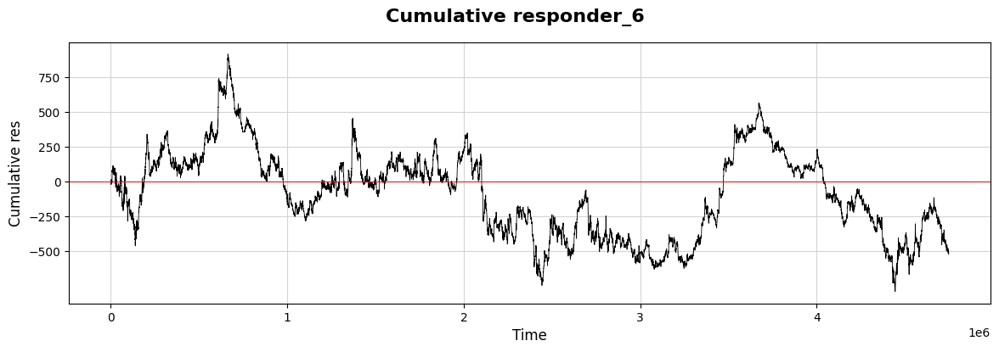

In [5]:
#for symbol_id=1
plt.figure(figsize=(14, 4))
plt.plot(xx,yy.cumsum(), color = 'black', linewidth =0.6)
plt.suptitle('Cumulative responder_6', weight='bold', fontsize=16)
plt.xlabel("Time", fontsize=12)
plt.ylabel("Cumulative res", fontsize=12)
plt.yticks(np.arange(-500,1000,250))
#plt.xticks(np.arange(0,170,10))
plt.grid(color = gridColor)
#plt.grid(color = 'lightblue')
plt.axhline(0, color='red', linestyle='-', linewidth=0.7)
plt.show()

As we dive into our project, let’s visualize some important data relating to our trading strategies using a graph. Imagine we’re creating a visual story that helps us see how a response evolves over time, much like tracking the growth of a plant as it reaches for the sun. 

We start by setting up our canvas. By calling `plt.figure(figsize=(14, 4))`, we're defining the size of our visual space, making sure it's wide enough to capture every important detail. Next, we bring in what we're actually plotting: `plt.plot(xx, yy.cumsum(), color='black', linewidth=0.6)`. Here, `xx` represents our timeline, while `yy.cumsum()` adds up our values cumulatively, capturing a developing narrative rather than isolated points. It's like following the total savings in a piggy bank over several weeks.

To add context to our graph, we use `plt.suptitle` to highlight what this visualization is all about. Think of it as putting a title on a book cover—it draws interest! We then label the axes, where `plt.xlabel("Time", fontsize=12)` and `plt.ylabel("Cumulative res", fontsize=12)` give clarity to what we’re observing. The y-ticks are defined with `plt.yticks(np.arange(-500, 1000, 250))`, marking the relevant amounts that help us interpret the cumulative response at a glance.

To make our graph look more polished, `plt.grid(color=gridColor)` adds a helpful backdrop, while `plt.axhline(0, color='red', linestyle='-', linewidth=0.7)` emphasizes the baseline we shouldn’t cross, acting like a caution line we all should pay attention to.

Finally, `plt.show()` presents our carefully crafted visual story. Just like a well-illustrated book brings concepts to life, this plot allows us to see how our trading strategies unfold over time, giving us insights that we can utilize in our decision-making process moving forward.

Let's take a moment to compare this responder (6) with the other responders.

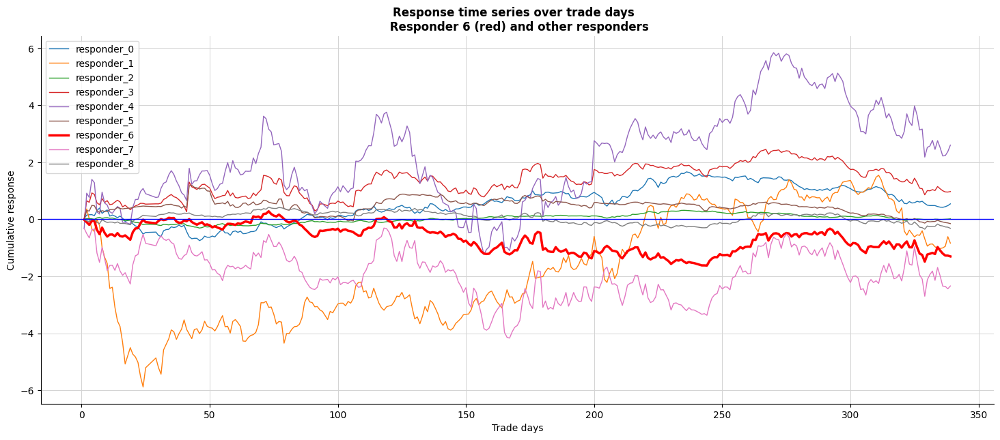

In [6]:
# for symbol_id == 0
plt.figure(figsize=(18, 7))
predictor_cols = [col for col in sample_df.columns if 'responder' in col]
for i in predictor_cols: 
    if i == 'responder_6': 
        c='red'
        lw=2.5
        plt.plot((sample_df[sample_df.symbol_id == 0].groupby(['date_id'])[i].mean()).cumsum(), linewidth = lw, color = c)
    else: 
        lw=1
        plt.plot((sample_df[sample_df.symbol_id == 0].groupby(['date_id'])[i].mean()).cumsum(), linewidth = lw)

plt.xlabel('Trade days')
plt.ylabel('Cumulative response')
plt.title('Response time series over trade days  \n Responder 6 (red) and other responders', weight='bold')
plt.grid(visible=True, color = gridColor, linewidth = 0.7)
plt.axhline(0, color='blue', linestyle='-', linewidth=1)
plt.legend(predictor_cols)
sns.despine()
#plt.show()

Imagine we’re setting the stage for a brilliant visualization of data related to trading responses over multiple days. We begin by defining the canvas—much like preparing a large easel for a beautiful painting—using `plt.figure` to create a wide space, specifically sized for our insights, at eighteen inches wide and seven inches tall. 

Next, we gather our ingredients; think of this as selecting the right spices from our kitchen. We sift through the columns of our dataset, filtering out the ones labeled with “responder.” These represent the various responses we want to examine as they evolve over time. 

Now, we enter a loop, which is like repeating a step in a recipe. Each iteration takes one of our selected responders and prepares to paint them on our figure. For the special case of `responder_6`, we’ve decided to give it a standout red color, like adding a dash of vibrant color to highlight a key ingredient, with a slightly thicker brush—2.5 for the line width to ensure it captures attention. We then plot the cumulative response for `responder_6` using a group-by technique that’s akin to aggregating our ingredients daily before serving up a flavorful dish.

For all other responders, the line remains thin—just one unit of attention—while also presenting their cumulative responses. Labels adorn our axes: ‘Trade days’ along the bottom and ‘Cumulative response’ on the side, along with a bold title that clearly signals what we’re examining. A horizontal blue line provides a baseline, just like setting a reference point in our charts to make interpretations easier.

Finally, with grid lines carefully placed to enhance clarity and a legend to guide our viewers through the flavors of this data, we create an inviting, visual representation of trading responses across days, tying together the complex narrative of our algorithmic trading journey on the Jane Street dataset. This serves not just as eye candy, but as a powerful tool to better understand market reactions and make those strategic trading decisions!

- It looks like `resp6` (in red) closely matches `resp0` and `resp3`.

Now, let’s create a correlation matrix to examine this numerically.

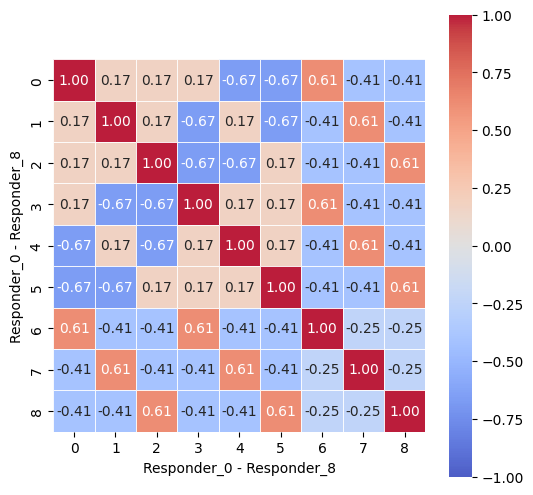

In [7]:
plt.figure(figsize=(6, 6))
responders = pd.read_csv(f"{path}/responders.csv")
matrix = responders[[ f"tag_{no}" for no in range(0,5,1) ] ].T.corr()
sns.heatmap(matrix, square=True, cmap="coolwarm", alpha =0.9, vmin=-1, vmax=1, center= 0, linewidths=0.5, 
            linecolor='white', annot=True, fmt='.2f')
plt.xlabel("Responder_0 - Responder_8")
plt.ylabel("Responder_0 - Responder_8")
plt.show()

Imagine we are embarking on a fascinating journey into the world of data visualization, particularly in the context of algorithmic trading. Our mission begins with crafting a visual representation of responses from various participants—let’s call them responders—using a vibrant heatmap. The first thing we do is set up our canvas with a specific size, creating a space where our image will unfold. Think of it as preparing the perfect platform for a grand artwork, inviting the viewer to dive into the details with the command `plt.figure(figsize=(6, 6))`.

Next, we gather our materials by reading the data from a CSV file, which is akin to opening a box full of puzzle pieces. The line that uses `pd.read_csv(f"{path}/responders.csv")` fetches all those pieces, allowing us to access detailed responses. 

Now, we want to see how these pieces relate to one another, so we create a matrix—a grid that captures relationships among responders based on a specific set of tags. Here, we cleverly select only the tags of interest through list comprehension with `responders[[ f"tag_{no}" for no in range(0,5,1) ]].T.corr()`. This transforms tabular data into a format that shows correlations, revealing patterns that might not be immediately obvious. 

With that matrix in hand, we use a heatmap function to paint our relationships in color. The command `sns.heatmap(...)` is like filling in a detailed map with colors that represent the value of each correlation, helping us understand the relationships at a glance. The parameters customize our visualization, ensuring clarity and aesthetic appeal.

Finally, we label our axes with `plt.xlabel` and `plt.ylabel`, guiding our viewers as if we were giving them a tour of the artwork. And as we unveil our masterpiece with `plt.show()`, we open the door to insights that could be pivotal in trading strategies. As we step back, we appreciate how this visual encapsulates the intricate web of interactions, ultimately helping us make more informed trading decisions in the ever-evolving market landscape.

Let's explore the returns, cumulative daily returns, and the distribution of returns for all responders.

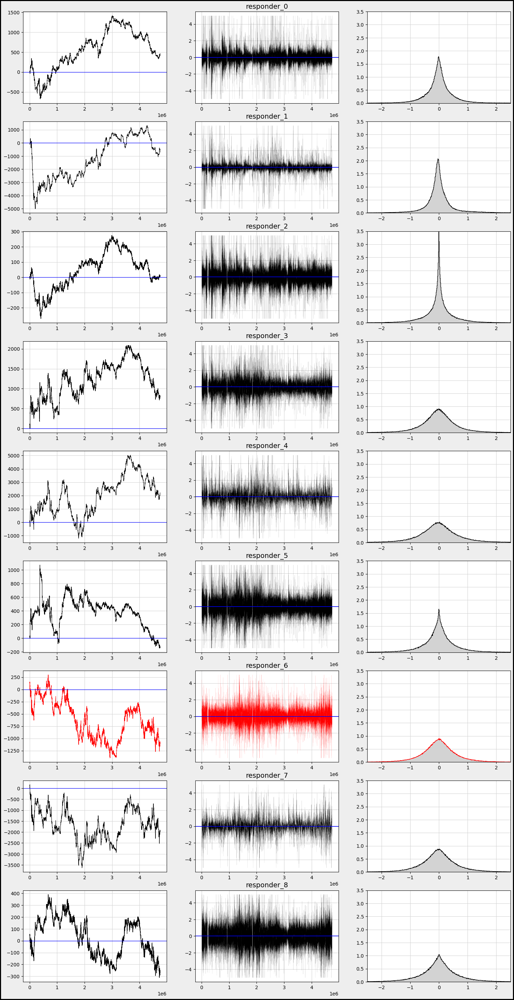

In [8]:
df_train=sample_df
s_id = 0                        # Change params to take a look at other symbols
res_columns = [col for col in df_train.columns if re.match("responder_", col)]
row = 9
j = 0

fig, axs = plt.subplots(figsize=(18, 4*row))
for i in range(1, 3 * len(res_columns) + 1, 3):
    xx= sample_df[(sample_df.symbol_id==s_id)] ['N']
    yy=sample_df[ (sample_df.symbol_id==s_id)][f'responder_{j}']
    c='black'
    if j == 6: c='red'
        
    ax1 = plt.subplot(9, 3, i)
    ax1.plot(   xx,yy.cumsum()   , color = c, linewidth =0.8 )
    plt.axhline(0, color='blue', linestyle='-', linewidth=0.9)
    plt.grid(color =gridColor )
    
    ax2 = plt.subplot(9, 3, i+1)
    #by_date = df_symbolX.groupby(["date_id"])
    ax2.plot(xx,yy   , color = c, linewidth =0.05)
    plt.axhline(0, color='blue', linestyle='-', linewidth=1.2)
    ax2.set_title(f"responder_{j}", fontsize = 14)
    plt.grid(color = gridColor)
    
    ax3 = plt.subplot(9, 3, i+2)
    b=1000
    ax3.hist(yy, bins=b, color = c,density=True, histtype="step" )
    ax3.hist(yy, bins=b, color = 'lightgrey',density=True)
    plt.grid(color = gridColor)
    ax3.set_ylim([0, 3.5])
    ax3.set_xlim([-2.5, 2.5])
    
    j = j + 1
    
fig.patch.set_linewidth(3)
fig.patch.set_edgecolor('#000000')
fig.patch.set_facecolor('#eeeeee') 
plt.show()

Alright everyone, let’s dive into our program that’s designed to analyze trading data in quite an insightful way. Imagine we have a dataset about trades, and each part of our code helps us visualize and understand how certain trading strategies, denoted by “responders,” perform over time.

We start by setting our training data with `df_train=sample_df`, a bit like choosing our colorful paints for a canvas. Next, we set `s_id` to zero, which is like picking our first character in a story, determining which trading symbol we want to explore. We then create a list of responder columns by filtering our data—consider these as special ingredients that we'll mix into our recipe.

With `row` and `j`, we prepare to create our layout for the visual, where `row` indicates how many rows of plots we want, and `j` begins to help us track which responder we’re currently investigating. Next, we set the stage for our plots by creating a figure with a specific size, making our canvas ready for the art of data visualization.

Now, in the loop, just like following steps in a recipe, we iterate through the responder columns, one at a time. For each responder, we extract two critical components: `xx`, which represents time, and `yy`, the values from our current responder column. We use a color code—black for most plots but red for a particular case—just like choosing a special color to draw attention.

We draw three types of plots within our loop: the cumulative plot, a time series plot, and a histogram. Each subplot serves a different purpose. The cumulative plot helps us understand the total effect over time, while the time series shows individual values as they change, and the histogram allows us to see the distribution of those values.

As we finish our visual creation, we enhance the aesthetics by adjusting the figure’s borders and background. Finally, we present our work of art using `plt.show()`, sharing our trading story visually. This whole process allows us to comprehend the patterns and effects of different trading strategies in an engaging way, giving us deeper insights into the exciting world of algorithmic trading.

We observe that responders exhibit varying behaviors and distributions.

Now, let's take a closer look at how `responder 6` behaves with different `symbol_id`s.

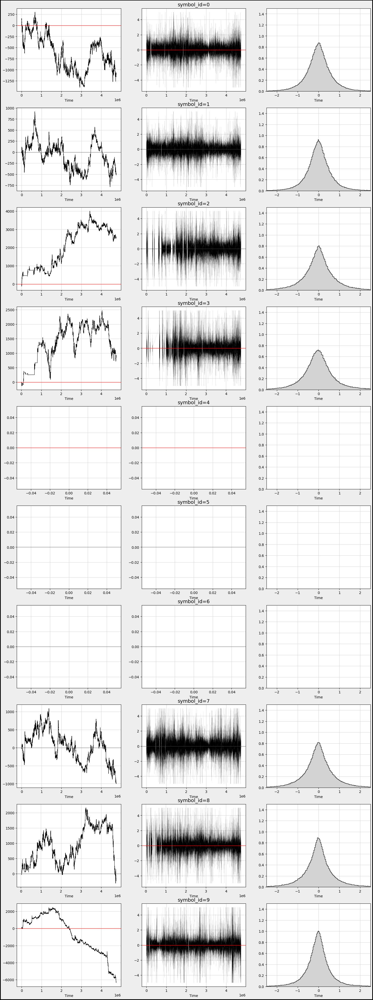

In [9]:
res_columns = [col for col in df_train.columns if re.match("responder_", col)]
row=10
fig, axs = plt.subplots(figsize=(18, 5*row))
b=300
j = 0
for i in range(1, 3 * row + 1, 3):
    xx= sample_df[(sample_df.symbol_id==j)] ['N']
    yy= sample_df[(sample_df.symbol_id==j)]['responder_6']
    c='black'
        
    ax1 = plt.subplot(row, 3, i)
    ax1.plot(   xx,yy.cumsum()   , color = c, linewidth =0.8 )
    plt.axhline(0, color='red', linestyle='-', linewidth=0.7)
    plt.grid(color = gridColor)
    plt.xlabel('Time')
    
    ax2 = plt.subplot(row, 3, i+1)
    ax2.plot(xx,yy   , color = c, linewidth =0.05)
    plt.axhline(0, color='red', linestyle='-', linewidth=0.7)
    ax2.set_title(f"symbol_id={j}", fontsize = '14')
    plt.grid(color = gridColor)
    plt.xlabel('Time')
    
    ax3 = plt.subplot(row, 3, i+2)
    ax3.hist(yy, bins=b, color = c, density=True, histtype="step" )
    ax3.hist(yy, bins=b, color = 'lightgrey',density=True)
    plt.grid(color = gridColor)
    ax3.set_xlim([-2.5, 2.5])
    ax3.set_ylim([0, 1.5])
    plt.xlabel('Time')
    
    j = j + 1
    
fig.patch.set_linewidth(3)
fig.patch.set_edgecolor('#000000')
fig.patch.set_facecolor('#eeeeee') 
plt.show()

Imagine we’re creating a visual story about the responses of different symbols in a trading dataset, capturing their behavior over time. We begin by gathering our "responder" columns from the larger dataset, like collecting ingredients for our dish. We then set up the canvas where our visualizations will take shape, deciding how many rows of graphs we want to create.

Next comes a loop—a bit like going through a recipe where we repeat steps for different ingredients, in our case, different symbols. For each symbol, identified by a unique `symbol_id`, we extract two key pieces of information: the times and their corresponding responses. Think of this as taking notes for our different ingredients.

As we step through our symbol data, we create three unique visualizations side by side, one for each iteration. The first subplot sketches a line graph showing how responses accumulate over time, providing insights into trends. It’s like observing how flavors blend as we simmer our dish. We draw a horizontal red line cutting across the graph to indicate a baseline, much like a taste test where we check if we need a pinch more salt.

The second subplot plots the responses directly against time, giving us a clearer view of how they behave in real-time—like watching the mixing process as we cook. This subplot also gets a title to remind us which symbol we are dealing with, adding context to our storytelling.

Finally, the third plot creates a histogram, breaking down the distribution of responses. This is akin to measuring the final dish to ensure it meets our expectations, showing how often each response occurs.

As we increment our symbol tracker, we wrap up each visual before finally presenting all of them together in a beautifully framed figure, ready to tell the most compelling story of how our trading symbols responded over time. Ultimately, we’re piecing together a narrative that will help in making informed decisions in the world of algorithmic trading, one vivid graph at a time.

- We notice that `responder 6` behaves differently and distributes uniquely based on each `symbol_id`.

Now, let’s take a closer look at the data before we continue our exploration of time series analysis.

## Overview of Files and Variables

### Features.csv
features.csv - contains information about the anonymized features.

#### Features contain many missing values.

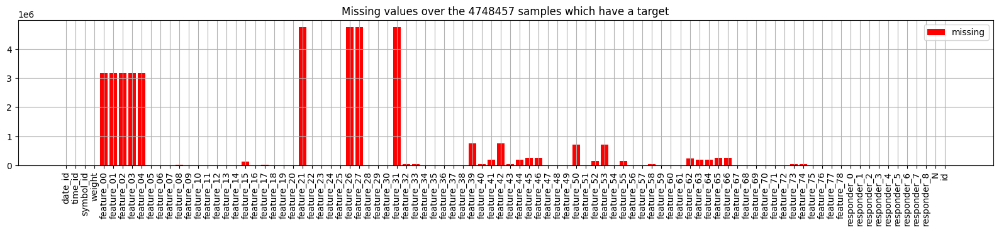

In [10]:
df_train = sample_df
plt.figure(figsize=(20, 3))    # Plot missing values
plt.bar(x=df_train.isna().sum().index, height=df_train.isna().sum().values, color="red", label='missing')   # analog: using missingno
plt.xticks(rotation=90)
plt.title(f'Missing values over the {len(df_train)} samples which have a target')
plt.grid()
plt.legend()
plt.show()

Imagine we are embarking on a journey to understand a dataset filled with valuable information, much like a treasure map. Our goal is to identify areas where important details are missing, which can impact our trading strategies. 

We begin by assigning our `df_train` variable to `sample_df`, which symbolizes our dataset—think of it as laying out our treasure map for everyone to see. Then, we create a canvas for our visualization with the line that sets the figure size; it's as if we’re choosing a spacious table to display our findings beautifully. 

Next, we delve into the heart of our analysis by constructing a bar chart to visualize the missing values in our dataset. The `df_train.isna().sum()` method acts like a detective, revealing the number of missing entries in each column of our map. By using these findings to plot a bar chart, we’re illustrating where the gaps lie—each bar stands like a warning sign indicating how many treasures are missing from that particular area.

We enhance our visual storytelling by rotating the x-ticks to ensure each column’s name is displayed clearly, like putting up a signpost that anyone can read. The title succinctly informs us of what we are looking at; it tells the story of how many samples we have and reminds us of our mission. 

Finally, we add a grid to our canvas, acting as a guide that helps us navigate through the visualization, and we include a legend to clarify the meanings of our colors. As we wrap up with the `show` function, it’s like inviting everyone to take a closer look at our findings. By understanding where the data is lacking, we’re setting ourselves up to improve our trading algorithms with confidence. Each of these steps not only makes our journey clearer, but also enhances the strategies we will ultimately develop for trading success.

- Some columns in our sample may not be very helpful, as they are either empty or display the partition number.

### Features Structure:

In [11]:
features = pd.read_csv(f"{path}/features.csv")
features

,feature,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,tag_9,tag_10,tag_11,tag_12,tag_13,tag_14,tag_15,tag_16
0,feature_00,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True
1,feature_01,False,False,True,False,False,False,False,False,False,False,False,False,False,True,True,False,True
2,feature_02,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True
3,feature_03,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True
4,feature_04,False,False,True,False,False,False,False,False,False,False,False,False,True,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,feature_74,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False
75,feature_75,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False
76,feature_76,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False
77,feature_77,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False


Imagine we’re embarking on a journey into the world of algorithmic trading, where data plays a pivotal role. In our quest, the first step is to gather the treasures hidden in an enchanted forest of numbers—our dataset. Here, we are using a magical tool called `pandas`, which helps us handle and manipulate data effortlessly.

As the sun rises on our adventure, we open up a special map with a specific command. Think of it as unrolling a treasure chest, where `pd.read_csv` acts as our key, allowing us to peek inside a file named `features.csv`. This file resides in a particular location in our virtual realm, defined by `path`. By placing `{path}/features.csv` in our command, we create a clear path to the data treasure we seek.

When we execute this command, it pulls all the data from the CSV file into our program, filling a vessel called `features`. This vessel now brims with valuable information, each row and column a small gem of insight about trading parameters. Just like reading a library book, we can easily explore what treasures lie within by simply mentioning `features`, allowing us to view the contents right away.

In our journey, this initial step is crucial, as it lays the groundwork for the magical algorithms we will eventually craft. By understanding the foundation of our data, we equip ourselves to make informed trading decisions on the bustling markets represented by Jane Street’s dataset. As we continue, we’ll learn to manipulate this treasure trove of information into something that can help us thrive in the world of algorithmic trading.

Visualizing Tags:

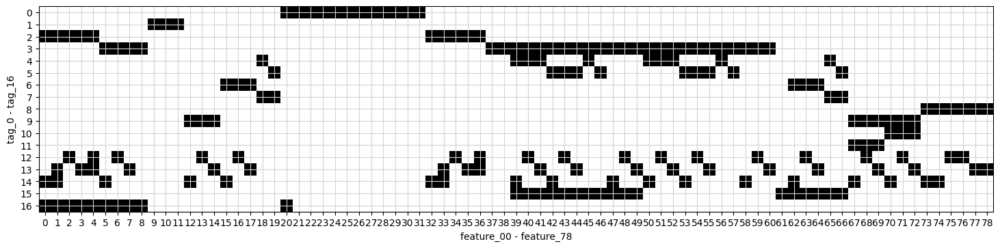

In [12]:
plt.figure(figsize=(18, 6))
plt.imshow(features.iloc[:, 1:].T.values, cmap="gray_r")
plt.xlabel("feature_00 - feature_78")
plt.ylabel("tag_0 - tag_16")
plt.yticks(np.arange(17))
plt.xticks(np.arange(79))
plt.grid(color = 'lightgrey')
plt.show()

Imagine we’re embarking on a visual journey through the data we've collected for our algorithmic trading project. We start by creating a large canvas for our image, which is what the first line does. Setting the figure size to 18 by 6 is like choosing a spacious wall to hang a beautiful painting, allowing us to see our information clearly without any clutter.

Next, we display our data as an image. The command uses `imshow` to turn our features, excluding the first column, into a visual format where each point of data shines with intensity. Think of it as transforming numbers into a tapestry of color and light, where darker shades represent lower values and lighter shades represent higher ones.

We want to label our axes to provide context. Here, we’re labeling the x-axis with "feature_00 - feature_78," which indicates we’re looking at many characteristics of our data, like the ingredients in a recipe. On the y-axis, we label it "tag_0 - tag_16," which represent categories or classifications of our data. These labels are like signposts guiding visitors through our artwork, making it clear what they’re looking at.

The next few lines enhance our visual experience. The `yticks` and `xticks` functions neatly position tick marks along the axes, ensuring clarity, much like arranging flowers in a vase for a perfect arrangement. The addition of a grid with a light grey color helps our eyes navigate the data landscape more smoothly.

Finally, `show()` unveils our masterpiece. This is like stepping back and revealing a completed painting to an audience, allowing them to appreciate the beauty of the relationships within our data. Together, we’ve created a visual representation that aids in understanding how our features and tags interact, crucial for developing our trading algorithms as we move forward.

Correlation Matrix for Feature XX and Feature YY

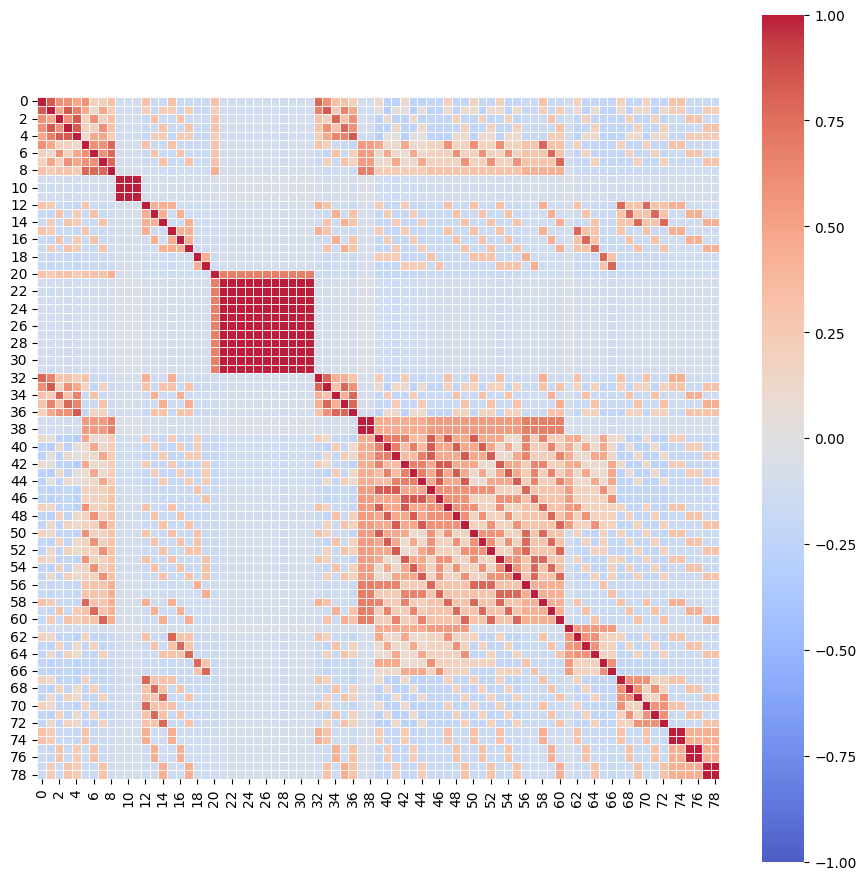

In [13]:
plt.figure(figsize=(11, 11))
matrix = features[[ f"tag_{no}" for no in range(0,17,1) ] ].T.corr()
sns.heatmap(matrix, square=True, cmap="coolwarm", alpha =0.9, vmin=-1, vmax=1, center= 0, linewidths=0.5, linecolor='white')
plt.show()

Imagine we’re painting a beautiful picture of relationships between various features in our dataset. To start, we create a canvas of a specific size with `plt.figure(figsize=(11, 11))`, which tells our program how large to make our artwork, providing enough room for all the details we want to convey.

Next, we gather our ingredients—the features we want to analyze—using `features[[ f"tag_{no}" for no in range(0,17,1) ] ]`. Here, we’re collecting data from 17 different columns, each representing a different "tag." Think of this as picking specific colors from a palette to work with. After selecting these features, we transpose the data (`.T`), flipping it so we can analyze how each tag relates to the others, turning our data into a matrix.

Now, we measure how all these colors work together by calculating their correlation with `.corr()`. This step is like mixing our selected colors to see which ones create harmonious or contrasting effects. The correlation matrix we create shows us the strength and direction of these relationships.

With our matrix ready, we bring it to life visually through `sns.heatmap()`. This function is like our paintbrush, allowing us to fill in the canvas with vibrant colors representing the strengths of the correlations. The parameters we set—like `cmap="coolwarm"` for the color scheme and `alpha=0.9` for transparency—determine how our data looks, whether it reflects warm relationships (high positive correlations) or cool ones (negative correlations). Finally, we complete our painting with `plt.show()`, unveiling our masterpiece to see how the features relate to one another in our algorithmic trading context.

Together, we’ve created a visual representation that can help us understand complex relationships in the data we’ll analyze for trading strategies. It’s like giving our trading algorithms a clearer lens through which to view the world.

Responders.csv
responders.csv - information about the anonymous responders  
Structure of responders:

In [14]:
responders = pd.read_csv(f"{path}/responders.csv")
responders

,responder,tag_0,tag_1,tag_2,tag_3,tag_4
0,responder_0,True,False,True,False,False
1,responder_1,True,False,False,True,False
2,responder_2,True,True,False,False,False
3,responder_3,False,False,True,False,True
4,responder_4,False,False,False,True,True
5,responder_5,False,True,False,False,True
6,responder_6,False,False,True,False,False
7,responder_7,False,False,False,True,False
8,responder_8,False,True,False,False,False


Imagine we’re stepping into the world of algo trading, where our mission is to analyze data to make smart trading decisions. In this adventure, we need to begin by gathering the information we need, and that's where our first step unfolds. We’re reaching out to a file named "responders.csv," which holds crucial data about various traders or market responses.

The first line acts like a bridge connecting our program with the data we want, using a library called `pandas`, often affectionately known as `pd`. When we write `responders = pd.read_csv(f"{path}/responders.csv")`, we’re telling our program: "Hey, go find that file, and read the treasures inside!" The `pd.read_csv` function is like a magical key that unlocks the CSV file. It knows how to interpret the structured data within so that we can play with it later. 

The `f"{path}/responders.csv"` part is a bit like giving directions. We use an f-string to create a pathway to our file that combines a variable named `path` with the specific filename. Think of `path` as a treasure map that tells us where to dig! By storing the data in a variable called `responders`, we create a container, much like a treasure chest, ready to hold our precious information for further exploration.

Finally, when we simply write `responders`, it’s like looking inside our treasure chest to see what we've found. The program will display the contents of our newly gathered data, so we get a glimpse of the information we will analyze as we embark on strategies for trading. In the grand scheme of our project, efficiently loading and exploring data is crucial for successfully implementing and testing our trading algorithms on the Jane Street dataset. So, let’s dive in and see what valuable insights await us!

Weights
Basic Statistics:

In [15]:
sample_df['weight'].describe().round(1)

count    4748457.0
mean           1.9
std            1.0
min            0.4
25%            1.2
50%            1.7
75%            2.3
max            8.1
Name: weight, dtype: float64

Imagine we’re exploring a treasure chest filled with numbers, and we want to understand what treasures lie within a specific collection. Here, we’re diving into a dataset called `sample_df`, which holds important information for our algorithmic trading project. Our goal is to look closely at a particular column named 'weight', which represents the significance or size of certain trading elements in our data.

As we start our journey, the `sample_df['weight']` expresses our intent to focus solely on that 'weight' column, much like selecting a single ingredient from our pantry to analyze. Now, what we want to do with that ingredient is to explore its characteristics—its average, min, max, and other statistics. To achieve that, we use the `describe()` function, which is like pulling out a detailed report card for our chosen ingredient. This function summarizes various statistics, providing insights all at once, just as a brief summary might highlight a dish's flavor profile.

Next, we notice the `round(1)` at the end. This step is akin to refining our measurements in cooking; we choose to simplify the details by rounding to one decimal place. It helps make the overview clearer and easier to digest, especially when making quick decisions based on the summarized data.

In essence, this line of code is like preparing a dish with precise measurements that showcase the essence of our 'weight' column. Understanding these statistics is crucial in algorithmic trading, as it will guide our strategies and decisions based on how we assess the significance of different trades. Just as a chef relies on the quality of ingredients, we rely on these insights to navigate our trading endeavor successfully.

Sure, please provide the markdown text you would like me to rewrite.

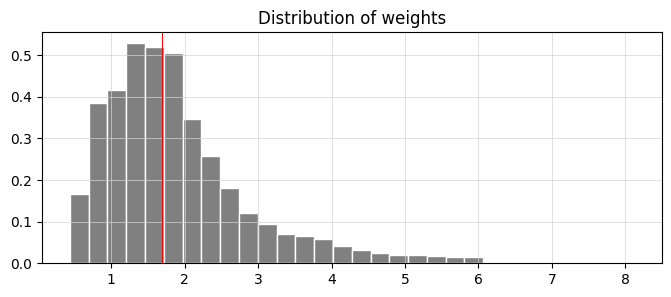

In [16]:
plt.figure(figsize=(8,3))
plt.hist(sample_df['weight'], bins=30, color='grey', edgecolor = 'white',density=True )
plt.title('Distribution of weights')
plt.grid(color = 'lightgrey', linewidth=0.5)
plt.axvline(1.7, color='red', linestyle='-', linewidth=0.7)
plt.show()

Imagine you're throwing a party, and you want to visualize the weights of the snacks you’ll have. Our goal here is to create a histogram that showcases the distribution of these weights, just like arranging and categorizing all the different snacks by their size. We start by calling on a friend, `plt.figure`, who sets the stage by creating a space to display our information. The dimensions of the space, like an inviting room for your guests, are shaped by the `figsize=(8,3)` which indicates width and height to ensure everything fits well.

Next, we dive into building our histogram, using `plt.hist`. Think of this as sorting our snacks into 30 boxes based on their weights, where each box represents a range of weights and is filled according to how many snacks fall into that range. The color grey provides a nice neutral backdrop, while the white edges help each box stand out clearly—it’s like labeling each box to make things visually appealing and easy to understand. The `density=True` flag indicates that we want the total height of the boxes to add up to one, making it easier to compare proportions.

We then give our visual a title, "Distribution of weights," which tells our viewers what they’re looking at, much like a sign at your party guiding your guests toward the snack table. Adding a grid with `plt.grid` serves as a gentle reminder of where everything lies, much like the furniture layout in your party space to navigate with ease. 

To bring attention to a specific snack weight, we add a red line at 1.7 using `plt.axvline`, highlighting its significance—think of it as marking your favorite snack on the table. Finally, `plt.show()` reveals our creation to the world. In our journey through understanding data and visualization in algo trading, transforming complex patterns into insightful graphics helps traders make informed decisions based on observed distributions.

In [17]:
sub = pd.read_csv(f"{path}/sample_submission.csv")
print( f"shape = {sub.shape}" )
sub.head(10)

shape = (39, 2)


,row_id,responder_6
0,0,0.0
1,1,0.0
2,2,0.0
3,3,0.0
4,4,0.0
5,5,0.0
6,6,0.0
7,7,0.0
8,8,0.0
9,9,0.0


Today, we're diving into a small but important task within our larger project of algorithmic trading using the Jane Street dataset. Let’s imagine we want to check in on a list of submissions, kind of like inspecting the roster of a sports team to see who made the cut. We start by pulling in the data from a file named "sample_submission.csv" using a magical function called `read_csv`, which belongs to a handy tool called Pandas. Picture Pandas as a friendly librarian that helps us browse through vast amounts of data quickly. 

By passing the path of our file to `pd.read_csv`, we’re essentially telling our librarian exactly where to find our request—how exciting! Once we've got our data, we want to see how big this roster is, so we print out its shape—a bit like checking a sports team's lineup to see how many players are on it. The `shape` attribute gives us the dimensions of our dataset, which is like saying the team has a certain number of players in specific roles.

After we know how many entries we have, we want to take a quick look at the first ten rows of our dataset with `sub.head(10)`. Think of this as peeking at the first page of a new book; it helps us understand what kind of information we have and if it meets our expectations. These ten records give us a glimpse into what we'll be working with as we refine our trading strategies.

By understanding this part of our code, we’re setting the stage to manipulate and analyze our data effectively, ensuring that we're well-prepared for the more complex tasks ahead in our trading project.

Train.parquet is the training dataset containing historical market data and returns, and it is split into ten parts for convenience. It includes the columns date_id and time_id, which are ordinal integers used to arrange the data chronologically, although the spacing between time_id values is not always consistent. The column symbol_id uniquely identifies each financial instrument. The column weight represents the weight applied when calculating the scoring function. The dataset also includes feature_00 to feature_78, which contain anonymized market features, and responder_0 to responder_8, which contain anonymized responder values clipped between −5 and 5. Among these responders, responder_6 is the one used as the prediction target.

Each row in the train.parquet or test.parquet dataset represents a unique combination of a financial symbol (identified by symbol_id) and a timestamp defined by date_id and time_id. Multiple responders are available, but only responder_6 affects scoring. The value in date_id indicates the day of the event, while time_id describes the order of times on that day, and the true time interval between time_id values may vary. Not every symbol_id appears at every date_id and time_id combination, and new symbol_id values may appear later in future test data.

Responders: Analysis, Statistics, and Distributions

In [18]:
col =[]
for i in range(9):
    col.append(f"responder_{i}") 

sample_df[col].describe().round(1)

,responder_0,responder_1,responder_2,responder_3,responder_4,responder_5,responder_6,responder_7,responder_8
count,4748457.0,4748457.0,4748457.0,4748457.0,4748457.0,4748457.0,4748457.0,4748457.0,4748457.0
mean,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
std,0.9,1.0,0.8,1.1,1.1,1.0,0.9,0.9,0.9
min,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0
25%,-0.3,-0.3,-0.2,-0.4,-0.5,-0.3,-0.4,-0.4,-0.3
50%,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
75%,0.3,0.2,0.2,0.4,0.5,0.2,0.4,0.4,0.3
max,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0


Imagine we’re creating a system that helps us analyze trading data from Jane Street. Our first task is to prepare a collection of identifiers, which we can think of as labels that we’ll use to keep track of different "responders"—like nametags at a conference. 

To start, we create an empty list called `col`, where we'll store these labels. Think of this list as an empty box waiting to be filled with names. Next, we take a special action, known as a loop, which allows us to repeat a step multiple times, much like following a recipe for cookies where we keep adding ingredients until we have the right amount.

Here, we use `range(9)` to set our loop to run nine times, representing responder numbers from 0 to 8. Each time the loop runs, we take the current number `i`, and create a string that says "responder_" followed by that number. This is similar to writing down each nametag for our attendees. We then add this newly crafted string to our `col` list using the `append` method, which adds the new item right at the end of our box. 

Finally, we take our list of responder names and use it to analyze some data with `sample_df[col].describe()`. It’s like looking at all our nametags and getting a summary of how many attendees we have, their average, and more, allowing us to bring order to the chaos of data. When we wrap this output with `.round(1)`, we ask to display the numbers neatly rounded to one decimal place, just as we might tidy up our notes for clarity.

With all these pieces, we’ve set the stage to dive deeper into analyzing trading strategies effectively, helping us make informed decisions in the exciting world of algorithmic trading.

Fun Fact:
- All variable values fall neatly within the range of `[-5, 5]`

Responders-Responder Distributions
Let’s explore the connections between respondents and visualize the mutual distributions between 'reps 6' and other responders.

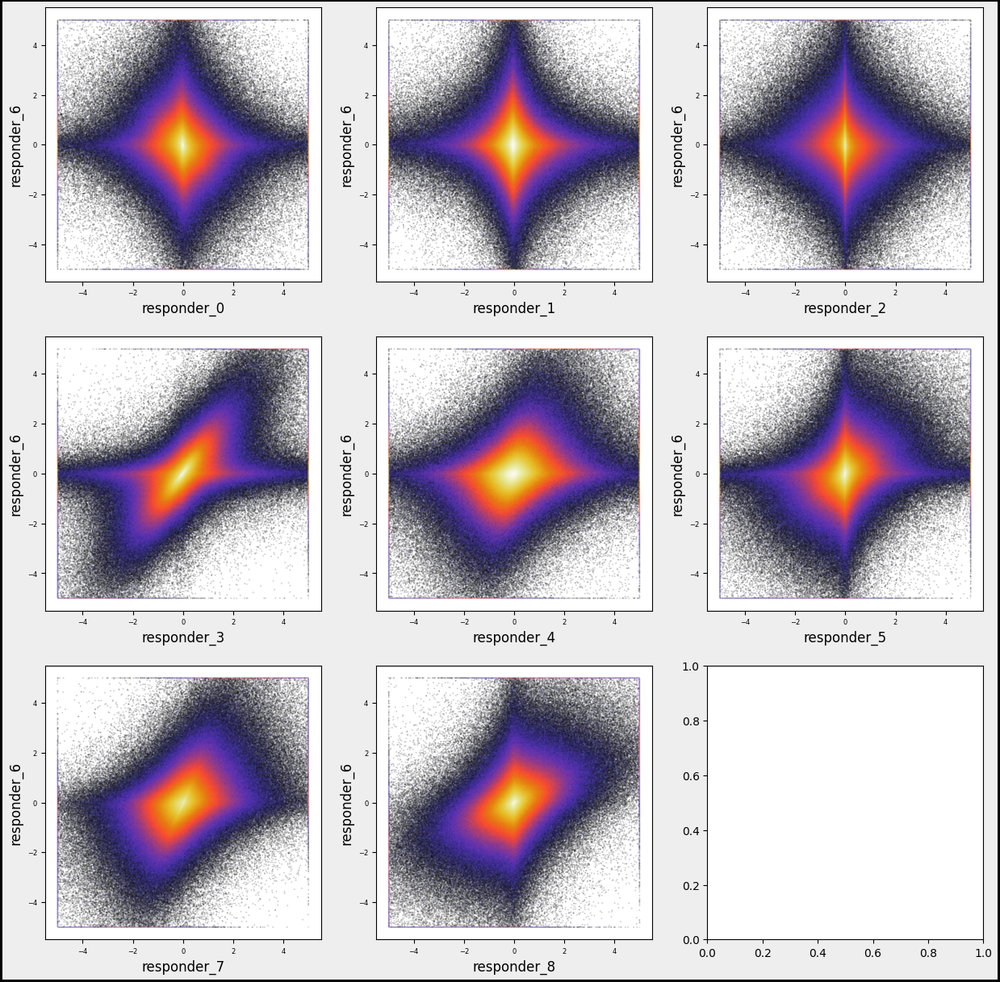

In [19]:
numerical_features=[]
numerical_features=sample_df.filter(regex='^responder_').columns.tolist() # Separate responders
numerical_features.remove('responder_6')

gs=600
k=1;
col = 3
row = 3
fig, axs = plt.subplots(row, col, figsize=(5*col, 5*row))

for i in numerical_features:
    
    plt.subplot(col,row, k)
    plt.hexbin(sample_df[i], sample_df['responder_6'], gridsize=gs, cmap='CMRmap', bins='log', alpha = 0.2)
    plt.xlabel(f'{i}', fontsize = 12)
    plt.ylabel('responder_6', fontsize = 12)
    plt.tick_params(axis='x', labelsize=6)
    plt.tick_params(axis='y', labelsize=6)
    k=k+1
fig.patch.set_linewidth(3)
fig.patch.set_edgecolor('#000000')
fig.patch.set_facecolor('#eeeeee')   

plt.show()

As we set out on our programming journey, let’s imagine we’re explorers navigating the dataset from Jane Street. Our aim is to visualize how different features, or attributes, relate to one of our responders, specifically 'responder_6'. 

We start by cultivating an empty list called `numerical_features`, which will hold the names of the attributes we want to investigate—like gathering ingredients before cooking. In the next step, we filter through our dataset, `sample_df`, to find all columns that begin with 'responder_' and collect their names. This is akin to sorting through a pantry to spot all the items we need, but we then set aside 'responder_6' so it doesn’t get mixed in with the others, ensuring we focus on just the other responders.

Now, we embark on creating a visual feast using a grid of graphs, setting up a large canvas to display our findings. We define how many rows and columns we want, which is similar to deciding how many plates we’ll prepare for our meal. With our canvas ready, we enter a loop that smoothly processes each feature from our list, one by one, just like following a cooking recipe step-by-step. For each feature, we produce a hexbin plot—a tool for visually summarizing data density—showing how each responder relates to our chosen 'responder_6'. 

We also take care to label our axes, adjust tick parameters for clarity, and finally, we decorate the edges of our figure to give it a polished look. Once all our features are plotted, we call `plt.show()` to reveal our work to the world, presenting a visual exploration of relationships in our dataset. This whole process enables us to better understand the patterns in trading, ultimately guiding our trading strategies based on data insights.

Responder6 - Feature Distributions
Let's take a moment to visualize the mutual distributions between 'reps 6' and various features.

<Figure size 1500x2500 with 0 Axes>

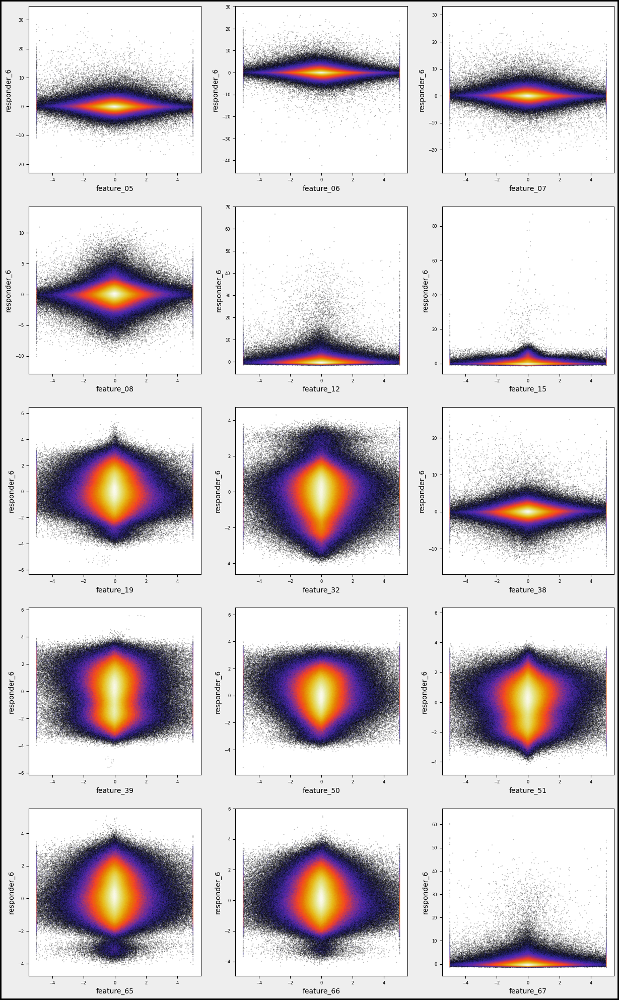

In [20]:
numerical_features=[]
for i in ['05', '06', '07', '08', '12', '15', '19', '32', '38', '39', '50', '51', '65', '66', '67']:
    numerical_features.append(f'feature_{i}') 

gs=600
k=1;
col = 3
row = int(np.ceil(len(numerical_features) /3 ))
sz=5
w=sz*col
h = w/col *row
plt.figure(figsize=(w, h))

fig, axs = plt.subplots(figsize=(w, h))

for i in numerical_features:
    
    plt.subplot(row, col, k)
    plt.hexbin(sample_df['responder_6'], sample_df[i], gridsize=gs, cmap='CMRmap', bins='log', alpha = 0.3)
    
    plt.xlabel(f'{i}')
    plt.ylabel('responder_6')
    plt.tick_params(axis='x', labelsize=6)
    plt.tick_params(axis='y', labelsize=6)
    k=k+1

fig.patch.set_linewidth(3)
fig.patch.set_edgecolor('#000000')
fig.patch.set_facecolor('#eeeeee')   
plt.show()   

Imagine we’re stepping into a world where data is our canvas and we’re about to paint some insightful visualizations. Our journey begins with creating a list called `numerical_features`, which will hold all the specific attributes we want to analyze. Picture this as gathering our ingredients before we cook. We're using a simple loop that takes a series of codes—like ‘05’, ‘06’, and so forth—and transforms them into more meaningful names, such as `feature_05`, which we then add to our list. This set of names is essential for our upcoming analysis.

Next, we set up some parameters for our artistic display. We define `gs`, which stands for gridsize, as 600. Think of this as how many little tiles we want in our data mosaic. Then we determine the layout, deciding how many columns and rows of plots we want on our canvas. Using a math function, we ensure our rows adjust dynamically based on the number of features we have—like arranging chairs around a table based on guests.

As we move forward, we create the figure that will hold all our plots. Each subplot acts like an individual storytelling page where we explore the relationship between a specific feature and `responder_6`. By employing a hexbin plot, we visualize the density of points—imagine this as painting areas more intensely where lots of data points overlap. 

With a few adjustments to our axes and visual appeal, we finalize our artwork. Finally, when we call `plt.show()`, it’s like unveiling our masterpiece to the world. This visual storytelling aids traders in understanding how various features correlate, enriching our larger goal of algorithmic trading on the Jane Street dataset.

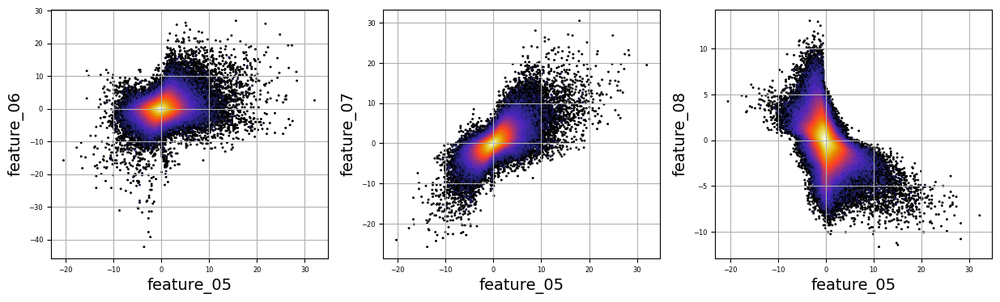

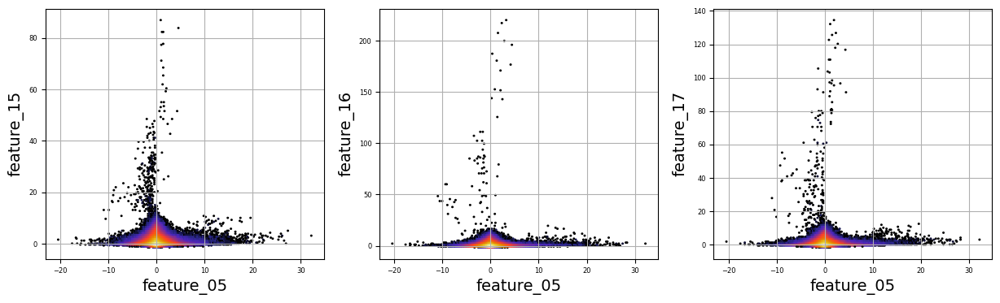

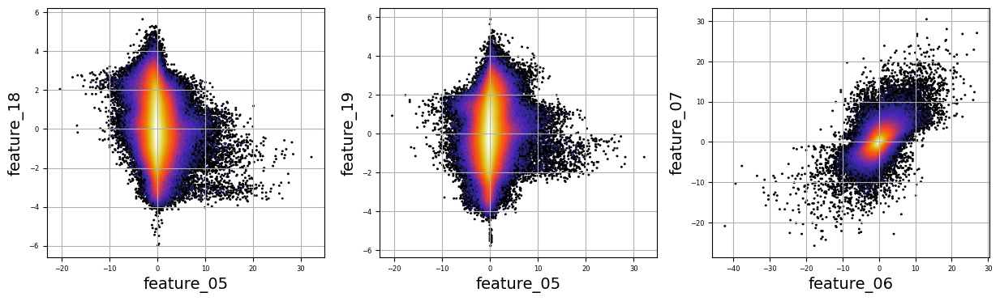

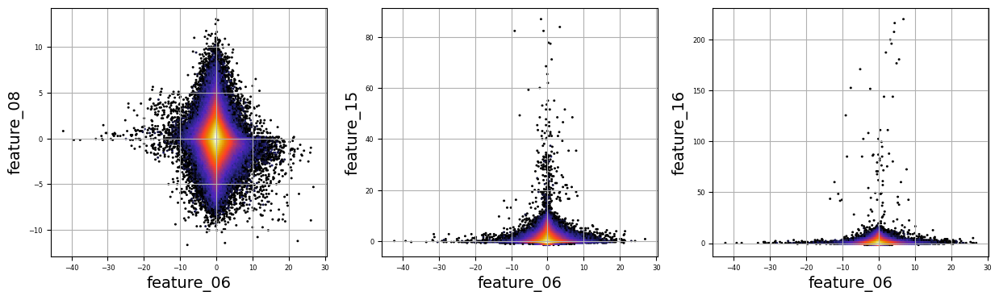

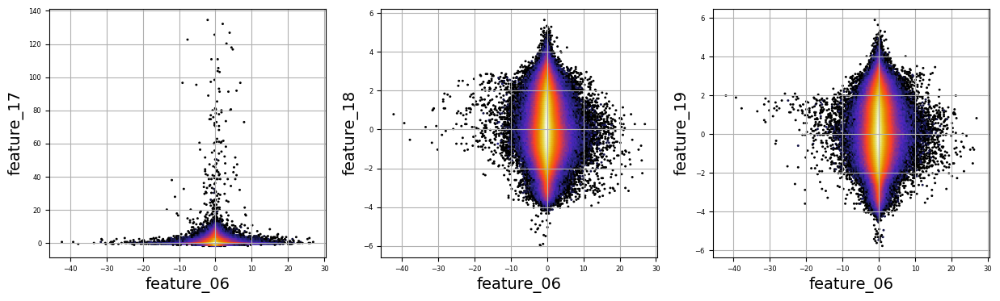

...

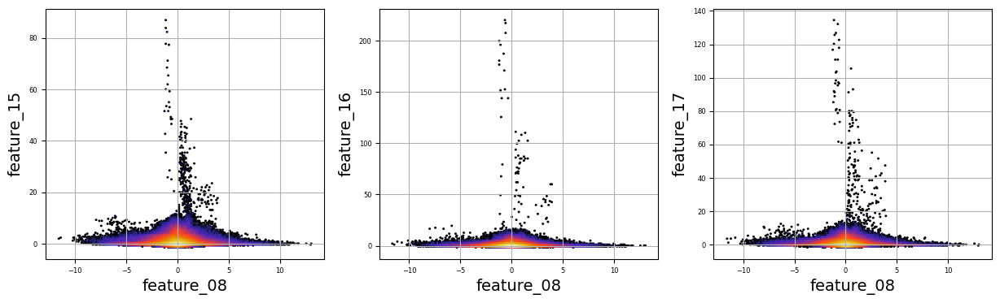

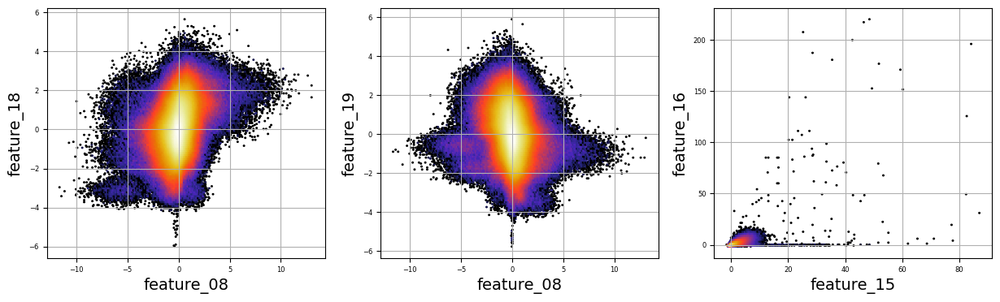

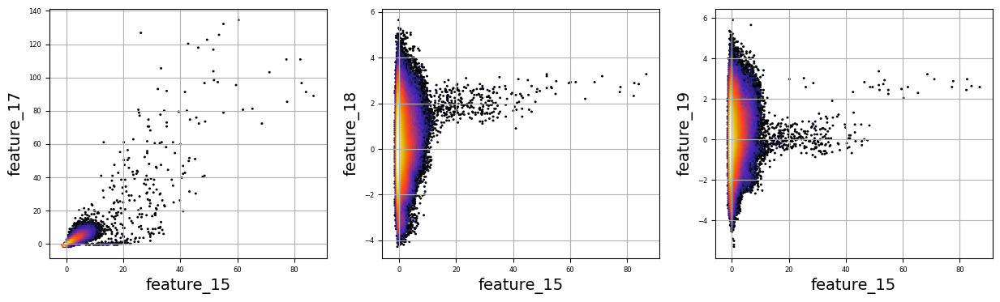

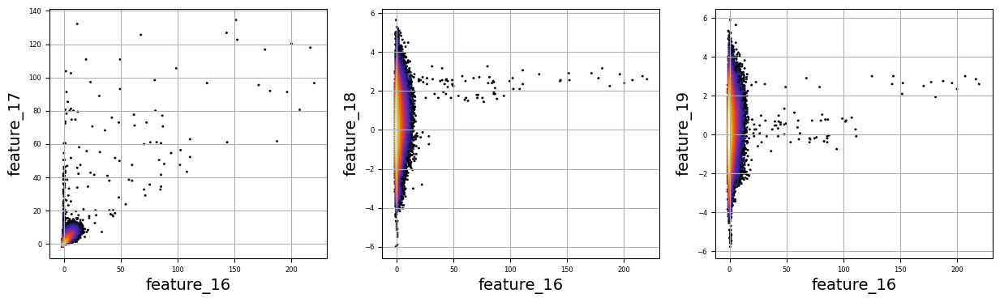

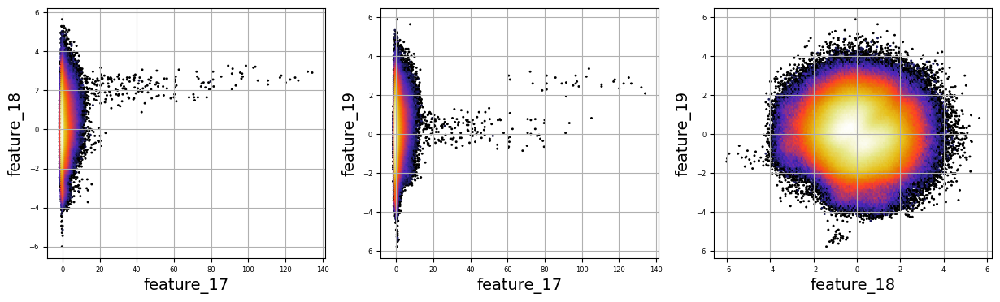

<Figure size 1500x400 with 0 Axes>

In [21]:
numerical_features=[]

for i in range(5,9):
    numerical_features.append(f'feature_0{i}') 
for i in range(15,20):
    numerical_features.append(f'feature_{i}') 
    
a=0; k=1;
n=3; 

fig, axs = plt.subplots(figsize=(15, 4))
for i in numerical_features[:-1]:
    a=a+1
    for j in numerical_features[a:]:
        plt.subplot(1,n, k)
        plt.hexbin(sample_df[i], sample_df[j], gridsize=200, cmap='CMRmap', bins='log', alpha = 1)
        plt.grid()
        plt.xlabel(f'{i}', fontsize = 14)
        plt.ylabel(f'{j}', fontsize = 14)
        plt.tick_params(axis='x', labelsize=6)
        plt.tick_params(axis='y', labelsize=6)
        
        k=k+1
        if k == (n+1):    
            k=1
            plt.show()
            plt.figure(figsize=(15, 4)) 

Imagine we are embarking on a journey to visualize complex relationships in trading data. Our program begins by creating an empty list named `numerical_features`, which will serve as our collection of features to explore. Think of it as gathering the ingredients you need before you start cooking.

To fill this list, we use a couple of loops, like following a recipe with different steps. The first loop runs from 5 to 8, adding `feature_05`, `feature_06`, `feature_07`, and `feature_08` to our repertoire. Then, we move on to the second loop, which adds `feature_15`, `feature_16`, `feature_17`, `feature_18`, and `feature_19`. Now, we have a robust set of ingredients to work with!

Next, we set up some friendly variables to help us organize how we display our visualizations. With `a` for indexing, `k` for tracking our subplot positions, and `n` defining how many plots we want to show in one row, we’re ready to start constructing our visual masterpiece.

We create a subplot with a specified size to hold our graphics. Now, we enter a nested loop: the outer loop goes through our `numerical_features`, and for each feature, the inner loop compares it to all succeeding features. This reminds us of comparing flavors in a dish—each feature brings its unique taste to the table. 

For each feature pair, we use `plt.hexbin` to create hexagonal bin plots, providing a clear view of how two features relate. We also format our plots with labels and gridlines, enhancing readability, which is like plating your dish neatly before serving. 

Finally, when we reach the end of our desired number of plots, we display what we’ve created and prepare for the next batch. This visualization process is critical in our larger project, as it helps us understand the intricate relationships within our trading data, guiding us to make better informed trading decisions.

- M

# <div id='model' style="color:white; font-weight:bold; font-size:120%; text-align:center; padding:12.0px; background:black">MODELLING</div>

<a href="#list-tab" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:Blue; font-size:140%; background:lightgrey; font-weight:bold;" data-toggle="popover" title="go to Colors">RETURN</a>

This is just an initial attempt at modeling and experimentation.  
Ensemble settings:

In [5]:
ENSEMBLE_SOLUTIONS = ['SOLUTION_14','SOLUTION_5']
OPTION,__WTS = 'option 91',[0.899, 0.28]

Imagine we're crafting a clever little robot that uses data to help us make trading decisions. Our first step is to define some important building blocks that will guide our robot's actions. You can think of these building blocks as being written on a recipe card that our robot will refer to whenever it wants to make a trade.

Here, we start with `ENSEMBLE_SOLUTIONS = ['SOLUTION_14','SOLUTION_5']`. This line is like telling our robot, "Hey, here are two backup plans for trading, which we can think of as two different strategies it can choose from." Both "SOLUTION_14" and "SOLUTION_5" are like different flavors of ice cream—one might work better for certain market conditions than the other.

Next, we see `OPTION,__WTS = 'option 91',[0.899, 0.28]`. This is a bit like laying out the specific recipe we're going to follow. Here, we define `OPTION` as 'option 91', which indicates a particular trading option our robot will look at, much like choosing a specific dish to cook. The `__WTS` variable, which stands for "weights," is a set of numbers that tells our robot how much faith to put in each of those solutions we've selected. In our case, `0.899` and `0.28` are like the amounts of each ingredient we need, helping to balance out our robot's decision-making. 

So, with these defining lines, we're setting the stage for our robot to be smart and strategic in its trading, preparing it to weigh options based on past performance. As we continue in this larger project of algorithmic trading with the Jane Street dataset, we'll see how these foundational choices become vital to our robot's success in navigating the financial markets.

In [6]:
def predict(test:pl.DataFrame, lags:pl.DataFrame | None) -> pl.DataFrame | pd.DataFrame:    
    pdB = predict_14(test,lags).to_pandas()
    pdC = predict_5 (test,lags).to_pandas()

    pdB = pdB.rename(columns={'responder_6':'responder_B'})
    pdC = pdC.rename(columns={'responder_6':'responder_C'})
    pds = pd.merge(pdB,pdC, on=['row_id'])
    pds['responder_6'] =\
        pds['responder_B'] *__WTS[0] +\
        pds['responder_C'] *__WTS[1] 

    display(pds)
    predictions = test.select('row_id', pl.lit(0.0).alias('responder_6'))
    pred = pds['responder_6'].to_numpy()
    predictions = predictions.with_columns(pl.Series('responder_6', pred.ravel()))
    return predictions

Imagine we're creating a sophisticated solution to predict responses using historical data, a bit like forecasting the weather based on past patterns. Our journey begins with defining a function, or a reusable recipe card, called `predict`. This function takes two ingredients, `test`, which holds our data, and `lags`, an optional component that can help refine our predictions.

We start by calling two separate functions, `predict_14` and `predict_5`. Think of these as two different weather experts providing their insights; both take in our data and return predictions, which we then convert from a special format to a more familiar form called a DataFrame using the `to_pandas` method, like transcribing their notes into a shared notebook.

Next, we tidy up our predictions by renaming columns. It's like giving new names to the weather experts' findings to avoid confusion—`responder_6` transforms into `responder_B` for one expert and `responder_C` for the other. We merge these two sets of predictions based on a common identifier, `row_id`, creating a comprehensive picture of our forecasts, akin to collating weather data from multiple sources.

Then, we calculate a final prediction, dubbed `responder_6`, by blending the two experts' insights with specific weights. It's like deciding that one expert's opinion should carry more weight based on their accuracy in the past.

We use the `display` function to showcase our combined predictions, which is like hanging our latest weather report on the bulletin board for everyone to see. Finally, we prepare these predictions to be returned in a structured format, ensuring our work is clean and ready for use.

And now, with this function completed, we’re one step closer to harnessing powerful predictions for our trading project, making informed decisions based on the trends we’re uncovering.

5. [JS Ridge Baseline](https://www.kaggle.com/code/yunsuxiaozi/js-ridge-baseline) - Lb = 0.0026  
By [yunsuxiaozi](https://www.kaggle.com/yunsuxiaozi)

In [7]:
if 'SOLUTION_5' in ENSEMBLE_SOLUTIONS:
    
    def predict_5(test,lags):
        cols=[f'feature_0{i}' if i<10 else f'feature_{i}' for i in range(79)]
        predictions = test.select(
            'row_id',
            pl.lit(0.0).alias('responder_6'),
        )
        test_preds=model_5.predict(test[cols].to_pandas().fillna(3).values)
        predictions = predictions.with_columns(pl.Series('responder_6', test_preds.ravel()))
        return predictions

if 'SOLUTION_5' in ENSEMBLE_SOLUTIONS:
    from sklearn.linear_model import BayesianRidge
    import joblib
    model_5 = joblib.load('/kaggle/input/jane-street-5-and-7_/other/default/1/ridge_model_5(1).pkl')

Imagine we are setting up a smart system to help us make predictions based on data from Jane Street. First, we want to check if we have the right tools, specifically if 'SOLUTION_5' is in a collection called `ENSEMBLE_SOLUTIONS`. This is like checking if we have the correct recipe before we start cooking. If it’s there, we move ahead to prepare our prediction function, which we can think of as crafting a reusable recipe card we can call upon whenever we need.

In our `predict_5` function, we have two inputs: `test` which is our dataset and `lags`, although we may not use `lags` directly here. We begin by defining a list of column names, `cols`, that will help us pull specific features from our dataset, similar to gathering all the necessary ingredients before we start baking. We want columns that represent features, and we format them to ensure they are named correctly, whether they are single or double digits.

Next, we create a `predictions` variable that starts with a base structure, defining a new column called `responder_6` and setting its initial value at zero. This is like preparing a baking tray with a base layer before adding the cake batter. Then we use our pre-trained model, `model_5`, to make predictions based on our test data, ensuring we fill any missing data with the value three, much like replacing a missing ingredient.

Finally, we take our predictions and add them as a new column to our earlier structure. Once completed, we return this enriched dataset, filled with the predictions we’ve crafted. Outside of this function, we also load our model, `model_5`, ensuring we have the right tool ready to go whenever needed. By setting this up, we’re gearing up to make informed trading predictions based on historical data—a vital step in our larger project of algorithmic trading.

14. [Jane Street RMF NN + XGB](https://www.kaggle.com/code/voix97/jane-street-rmf-nn-xgb) | Leaderboard Score: 0.0056  
Author: [Xiang Sheng](https://www.kaggle.com/voix97)

NN + XGB Inference

In [8]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:    
    
    class CONFIG:
        seed = 42
        target_col = "responder_6"
        # feature_cols = ["symbol_id", "time_id"] + [f"feature_{idx:02d}" for idx in range(79)]+ [f"responder_{idx}_lag_1" for idx in range(9)]
        feature_cols = [f"feature_{idx:02d}" for idx in range(79)]+ [f"responder_{idx}_lag_1" for idx in range(9)]

        model_paths = [
            #"/kaggle/input/js24-train-gbdt-model-with-lags-singlemodel/result.pkl",
            #"/kaggle/input/js24-trained-gbdt-model/result.pkl",
            "/kaggle/input/js-xs-nn-trained-model",
            "/kaggle/input/js-with-lags-trained-xgb/result.pkl",
        ]

if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    
    valid = pl.scan_parquet(
        f"/kaggle/input/js24-preprocessing-create-lags/validation.parquet/"
    ).collect().to_pandas()

Imagine we’re embarking on a journey to create an algorithm for trading, designed to make smart decisions using data. Our adventure begins with a check, much like ensuring we have our gear before a hike; we see if 'SOLUTION_14' is a part of our toolkit called ENSEMBLE_SOLUTIONS. If it is, we dive into our CONFIG class, which acts like a blueprint filled with vital instructions.

Inside this blueprint, we set a seed—42, which serves to ensure that our randomness is consistent every time we run our program. This is similar to using the same quantities in a recipe, so we get the same flavor each time we bake cookies. Next, we define our target column, "responder_6". Think of this as the ultimate prize in our cooking contest; it’s what we want to impress the judges with.

Then, we create our feature_cols, which are the ingredients we must measure and combine to whip up our predictive magic. First, we pull in a range of 79 features and then nine additional "lagged" responses—like keeping notes on past attempts at a recipe to see how they affect our current batch.

Moving on, we set model_paths—akin to creating a library of favorite cookbooks—these paths point towards the different trained models we've built and saved from earlier experiences. 

Our adventure continues as we check again for 'SOLUTION_14', reinforcing our path before we load in some validation data from a parquet file. This file is like our set of test tasters who offer feedback on our latest recipe. Finally, we transform that data into a friendly format—pandas DataFrame—so we can easily slice and serve it in our analyses.

All of these steps will help us refine our algo trading strategy, enabling us to harness the power of data effectively as we navigate through the complexities of financial markets.

### Load the Model

In [9]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS: 
    
    xgb_model = None
    model_path = CONFIG.model_paths[1]
    with open( model_path, "rb") as fp:
        result = pickle.load(fp)
        xgb_model = result["model"]

    xgb_feature_cols = ["symbol_id", "time_id"] + CONFIG.feature_cols

    # Show model
    #display(xgb_model)

if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    
    # Custom R2 metric for validation
    def r2_val(y_true, y_pred, sample_weight):
        r2 = 1 - np.average((y_pred - y_true) ** 2, weights=sample_weight) / (np.average((y_true) ** 2, weights=sample_weight) + 1e-38)
        return r2


    class NN(LightningModule):
        def __init__(self, input_dim, hidden_dims, dropouts, lr, weight_decay):
            super().__init__()
            self.save_hyperparameters()
            layers = []
            in_dim = input_dim
            for i, hidden_dim in enumerate(hidden_dims):
                layers.append(nn.BatchNorm1d(in_dim))
                if i > 0:
                    layers.append(nn.SiLU())
                if i < len(dropouts):
                    layers.append(nn.Dropout(dropouts[i]))
                layers.append(nn.Linear(in_dim, hidden_dim))
                # layers.append(nn.ReLU())
                in_dim = hidden_dim
            layers.append(nn.Linear(in_dim, 1))  
            layers.append(nn.Tanh())
            self.model = nn.Sequential(*layers)
            self.lr = lr
            self.weight_decay = weight_decay
            self.validation_step_outputs = []

        def forward(self, x):
            return 5 * self.model(x).squeeze(-1)  

        def training_step(self, batch):
            x, y, w = batch
            y_hat = self(x)
            loss = F.mse_loss(y_hat, y, reduction='none') * w  
            loss = loss.mean()
            self.log('train_loss', loss, on_step=False, on_epoch=True, batch_size=x.size(0))
            return loss

        def validation_step(self, batch):
            x, y, w = batch
            y_hat = self(x)
            loss = F.mse_loss(y_hat, y, reduction='none') * w
            loss = loss.mean()
            self.log('val_loss', loss, on_step=False, on_epoch=True, batch_size=x.size(0))
            self.validation_step_outputs.append((y_hat, y, w))
            return loss

        def on_validation_epoch_end(self):
            """Calculate validation WRMSE at the end of the epoch."""
            y = torch.cat([x[1] for x in self.validation_step_outputs]).cpu().numpy()
            if self.trainer.sanity_checking:
                prob = torch.cat([x[0] for x in self.validation_step_outputs]).cpu().numpy()
            else:
                prob = torch.cat([x[0] for x in self.validation_step_outputs]).cpu().numpy()
                weights = torch.cat([x[2] for x in self.validation_step_outputs]).cpu().numpy()
                # r2_val
                val_r_square = r2_val(y, prob, weights)
                self.log("val_r_square", val_r_square, prog_bar=True, on_step=False, on_epoch=True)
            self.validation_step_outputs.clear()

        def configure_optimizers(self):
            optimizer = torch.optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.weight_decay)
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5,
                                                                   verbose=True)
            return {
                'optimizer': optimizer,
                'lr_scheduler': {
                    'scheduler': scheduler,
                    'monitor': 'val_loss',
                }
            }

        def on_train_epoch_end(self):
            if self.trainer.sanity_checking:
                return
            epoch = self.trainer.current_epoch
            metrics = {k: v.item() if isinstance(v, torch.Tensor) else v for k, v in self.trainer.logged_metrics.items()}
            formatted_metrics = {k: f"{v:.5f}" for k, v in metrics.items()}
            print(f"Epoch {epoch}: {formatted_metrics}")

Once upon a time in the world of algorithmic trading, our journey begins when we check if a particular solution, ‘SOLUTION_14’, is included in our collection of ensemble solutions. If it is present, we enter a realm where we prepare to leverage a model, specifically an XGBoost model. Imagine this as reaching for a prized recipe card hidden away in a digital drawer that we've labeled with paths in our configuration. We open this drawer, which here is represented by a file, read its contents, and discover the model waiting for us.

Next, we set up our feature columns, which are like the essential ingredients in our recipe that will help us cook up predictions. To marry our ingredients with the model smoothly, we define a custom evaluation metric called R². Picture R² as a way to measure how well our cooked dish resembles the perfect taste we were aiming for—providing feedback on our model's predictions.

We then step into the vibrant life of a neural network, represented by a class called ‘NN’. This class is like a well-organized kitchen filled with layers of functions and dropouts, each performing a role to ensure the network learns efficiently. Each layer is built thoughtfully, just as one would follow steps in a cooking process, ensuring balance and flavor. 

When we feed data into our model, it’s akin to giving our dish a taste test, where we calculate the loss to understand how far we’ve strayed from our desired outcome. As we train the model, we take careful notes and update our cooking methods in the form of logged metrics, ensuring we refine each step, much like adjusting a recipe to perfect a dish over time.

As we wrap up our training, we gather our observations and summarize the results, which helps us ensure we’re on track. Together, we’ve walked through the intricate process of training a model to trade wisely in the market, always striving for that flavorful optimal prediction!

In [10]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    
    N_folds = 5
    models = []
    for fold in range(N_folds):
        checkpoint_path = f"{CONFIG.model_paths[0]}/nn_{fold}.model"
        model = NN.load_from_checkpoint(checkpoint_path)
        models.append(model.to("cuda:0"))

Today, let's dive into a small piece of code that’s part of a larger project focused on algorithmic trading using the Jane Street dataset. The journey starts with a question; if 'SOLUTION_14' is in our list of *ENSEMBLE_SOLUTIONS*, we’re ready to roll up our sleeves.

With our first step, we set up a variable called `N_folds`, which is simply defined as 5. Imagine we’re baking five batches of cookies to make sure they’re just right before serving them to our friends. Each batch will be processed separately, and this number helps us understand how many times we need to repeat our process.

Next, we create an empty list called `models`. Think of it as a container where we’ll keep all our cookie batches once they're ready. Inside a loop, which is like taking the same actions over and over again for each batch, we go through each fold from 0 to 4. In each iteration, we construct a file path named `checkpoint_path`. This is the recipe card telling us where to find our trained neural network model for that specific fold.

When we load the model from that checkpoint with `NN.load_from_checkpoint(checkpoint_path)`, it's akin to taking the cookies out of the oven. We don’t want just the delicious treats; we want them ready to eat, so we transform the model to use the GPU by calling `.to("cuda:0")`, ensuring it’s primed for speed and efficiency in our trades. Finally, we zip this model into our `models` list, ready for when we need to combine its predictions.

Overall, this code sets up a core part of our algorithmic trading strategy, ensuring that we have all our models at the ready, each trained on distinct data portions for reliable decision-making. Just like perfecting those cookie batches, we're honing in on the best trading strategies to navigate the market!

### CV Score

In [11]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS: 
    
    X_valid = valid[ xgb_feature_cols ]
    y_valid = valid[ CONFIG.target_col ]
    w_valid = valid[ "weight" ]
    y_pred_valid_xgb = xgb_model.predict(X_valid)
    valid_score = r2_score( y_valid, y_pred_valid_xgb, sample_weight=w_valid )
    valid_score

Imagine we're on a journey to build a smart trading system that intelligently predicts stock prices. As we step into our code together, we find ourselves in a little decision-making moment. The first line checks whether we have a certain solution, labeled 'SOLUTION_14', waiting for us in our collection of potential strategies, called `ENSEMBLE_SOLUTIONS`. Think of it like checking if a special recipe you’ve been waiting for is in your cookbook.

When we confirm that this solution is indeed there, we gather our ingredients for the prediction. The next three lines are all about preparing what we need from a dataset named `valid`. Our starting ingredients include `X_valid`, which represents the features or attributes we think will help us make a good guess about stock prices. Then we grab `y_valid`, the actual values we want to predict, which is like knowing the expected dish's flavor. Lastly, we collect `w_valid`, our weightings, akin to measuring how important each ingredient is in our dish.

The fun begins when we use our pre-trained model, `xgb_model`, to predict outcomes based on these features. It’s like following a well-practiced recipe and hoping for a delicious result. After making our predictions, we want to know how well we did, so we calculate a score using `r2_score`. This score tells us how closely our predictions match the actual values, considering the importance of each sample based on `w_valid`. A higher score means we’ve cooked up something tasty!

As we conclude this segment, remember that this process is crucial, laying the groundwork for our larger project: creating a robust trading strategy that can adapt and thrive in the market.

In [12]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    X_valid = valid[ CONFIG.feature_cols ]
    y_valid = valid[ CONFIG.target_col ]
    w_valid = valid[ "weight" ]
    X_valid = X_valid.fillna(method = 'ffill').fillna(0)
    X_valid.shape, y_valid.shape, w_valid.shape

if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    y_pred_valid_nn = np.zeros(y_valid.shape)
    with torch.no_grad():
        for model in models:
            model.eval()
            y_pred_valid_nn += model(torch.FloatTensor(X_valid.values).to("cuda:0")).cpu().numpy() / len(models)
    valid_score = r2_score( y_valid, y_pred_valid_nn, sample_weight=w_valid )
    valid_score

if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    y_pred_valid_ensemble = 0.5 * (y_pred_valid_xgb + y_pred_valid_nn)
    valid_score = r2_score( y_valid, y_pred_valid_ensemble, sample_weight=w_valid )
    valid_score

if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:
    del valid, X_valid, y_valid, w_valid
    gc.collect()

Imagine we're piecing together a puzzle that helps us make smart predictions in the world of algorithmic trading. Our goal here is to validate the accuracy of our models, ensuring they can effectively predict outcomes based on features or attributes in our dataset.

First, we check if a specific solution, labeled 'SOLUTION_14', is part of our ensemble of solutions. If it is, we set aside the parts of our dataset we need for validation—features, targets, and weights—using neat labels like `X_valid`, `y_valid`, and `w_valid`. Think of it as gathering ingredients for a recipe. We then address any missing values in the feature set by filling them in with the last known value, then substituting any remaining gaps with zeros. This makes sure our data is clean and ready to use.

Next, the excitement builds as we predict outcomes using a neural network! We create an array filled with zeros to hold our predictions. By using `torch.no_grad()`, we're saving memory by indicating we're not backpropagating errors; it's like focusing solely on baking, without worrying about storing extra ingredients. We loop through our models, calling each to predict on our cleaned features. Each model's output is averaged, blending their insights together to create a more robust prediction.

Continuing, we mix predictions from another model type, often called xgboost, blending them with our neural network predictions. By taking an average, we harness the wisdom of both methods, enhancing our prediction clarity.

Finally, when we're done processing, we clean up by deleting unnecessary variables and invoking garbage collection, like tidying up our kitchen after a long cooking session. This keeps our workspace efficient and ready for the next round. As we refine our understanding through this exploration, we move closer to making informed, successful trades in the bustling world of algorithmic trading.

In [13]:
if 'SOLUTION_14' in ENSEMBLE_SOLUTIONS:    
    
    lags_ : pl.DataFrame | None = None

    def predict_14(test: pl.DataFrame, lags: pl.DataFrame | None) -> pl.DataFrame | pd.DataFrame:
        global lags_
        if lags is not None:
            lags_ = lags

        predictions_14 = test.select(
            'row_id',
            pl.lit(0.0).alias('responder_6'),
        )
        symbol_ids = test.select('symbol_id').to_numpy()[:, 0]

        if not lags is None:
            lags = lags.group_by(["date_id", "symbol_id"], maintain_order=True).last() # pick up last record of previous date
            test = test.join(lags, on=["date_id", "symbol_id"],  how="left")
        else:
            test = test.with_columns(
                ( pl.lit(0.0).alias(f'responder_{idx}_lag_1') for idx in range(9) )
            )

        preds = np.zeros((test.shape[0],))
        preds += xgb_model.predict(test[xgb_feature_cols].to_pandas()) / 2
        test_input = test[CONFIG.feature_cols].to_pandas()
        test_input = test_input.fillna(method = 'ffill').fillna(0)
        test_input = torch.FloatTensor(test_input.values).to("cuda:0")
        with torch.no_grad():
            for i, nn_model in enumerate(tqdm(models)):
                nn_model.eval()
                preds += nn_model(test_input).cpu().numpy() / 10
        print(f"predict> preds.shape =", preds.shape)

        predictions_14 = \
        test.select('row_id').\
        with_columns(
            pl.Series(
                name   = 'responder_6', 
                values = np.clip(preds, a_min = -5, a_max = 5),
                dtype  = pl.Float64,
            )
        )

        # The predict function must return a DataFrame
        #assert isinstance(predictions, pl.DataFrame | pd.DataFrame)
        # with columns 'row_id', 'responer_6'
        #assert list(predictions.columns) == ['row_id', 'responder_6']
        # and as many rows as the test data.
        #assert len(predictions) == len(test)

        return predictions_14

Imagine we're on a mission to predict stock prices using a powerful dataset. Our program begins by checking if a specific solution, labeled 'SOLUTION_14', is available—this is like deciding whether we should take a particular route on our journey. If it's there, we initialize a variable called `lags_`, which will eventually hold lagged data that helps us make predictions about future values.

Next, we define a function called `predict_14`. Think of this function as a reusable recipe card that tells our program how to make predictions. It takes in two ingredients: `test`, which is our main dataset, and `lags`, which can be optional. If `lags` is present, we store it globally so we can use it later in our predictions.

As we dive deeper, we create an initial set of predictions. Here, we're selecting the `row_id` from our test data and setting up a placeholder response, ‘responder_6’, starting at zero. This is our blank canvas for the painting of predictions to come. If there are lagged values, we process them—like picking the freshest ingredients for our dish—by joining the lagged data to our test data based on relevant identifiers. If there are no lags, we simply fill in default values for them.

We then prepare for the heavy lifting. The program generates predictions with machine learning models. We use a model called `xgb_model` first, applying it to our test features—this part is akin to following the first steps in a recipe that requires blending ingredients. Then, we loop through a list of neural network models. Each model offers its own flavor, like different spices enhancing the dish, and we add their contributions to our predictions.

Finally, we finalize our predictions by clipping values to ensure they stay within a reasonable range. We need to format our results correctly, returning them in a DataFrame that includes the `row_id` and our predicted response. This entire process helps us gain insights that can guide our trading decisions in the world of algorithmic trading—turning data into actionable predictions on this exciting journey!